# Case study: ImageNet pre-training

In [4]:
import sys
import matplotlib 
import matplotlib.pyplot as plt
from pathlib import Path
import itertools

import numpy as np 
import pandas as pd
import seaborn as sns
import torch

sys.path.append('..')
from src.data import datasets
from src.data import transforms as data_transforms
from src.utils import common_utils
from src.utils import datamodels_utils as dm_utils
from src.utils import data_utils

%matplotlib inline
%load_ext autoreload
%autoreload 2

sns.set_style('whitegrid')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup

In [16]:
cmap = plt.get_cmap('tab10')
hist_kws = dict(element='step', lw=2, alpha=0.75, stat='count')
font_kws = dict(title_fs=17, label_fs=15, legend_fs=15, ticks_fs=14)

dsets = {k: datasets.Waterbirds(k, transform=data_transforms.WATERBIRDS_TRANSFORMS['test']) \
         for k in ['train', 'test', 'val']}


dm_names = {
    'ImageNet': r'Fine-tuned ImageNet model (algorithm $\mathcal{A}_1$)',
    'From scratch': r'Model trained from scratch (algorithm $\mathcal{A}_2$)'
}

dm_paths = {
    'ImageNet': '../datamodels/waterbirds_in-res50.pt',
    'From scratch': '../datamodels/waterbirds_random-init.pt'
}

## Model accuracies
Accuracies of Waterbrids models trained with and without ImageNet pre-training. These models are used to compute the datamodel matrices $\theta^{(1)}$ and $\theta^{(2)}$ that correspond to ImageNet models fine-tuned on Waterbirds and models trained from scratch.

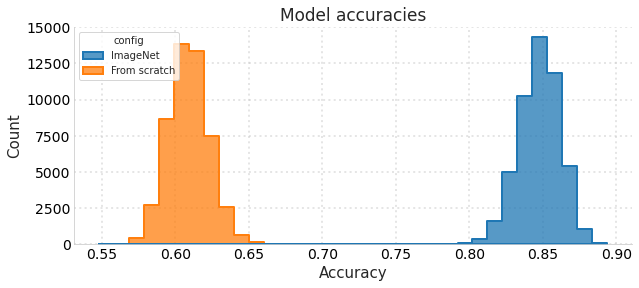

In [17]:
df = pd.read_pickle('metadata/waterbirds_accs_pct100.pkl') 
fig, ax = plt.subplots(1,1,figsize=(10,4))
ax = sns.histplot(data=df, x='test accuracy', hue='config', **hist_kws)
common_utils.update_ax(ax, 'Model accuracies', 'Accuracy', 'Count', legend_loc=False, **font_kws)
sns.move_legend(ax, 'upper left')

## Datamodel sparsity
Compare distribution over (row-wise) fraction of non-zeros in datamodels matrices $\theta^{(1)}$ and $\theta^{(2)}$.

[None, None, None, None]

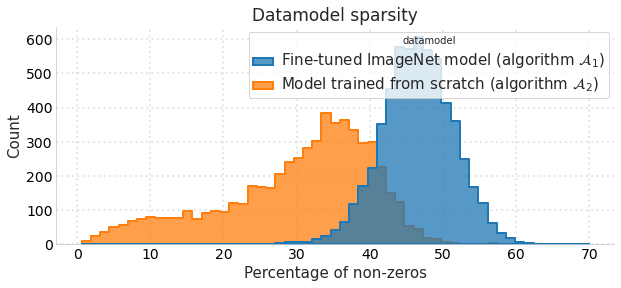

In [18]:
dfs = []
sp_map = {}

for key, pth in dm_paths.items():
    if not pth: continue
    dm = np.array(torch.load(pth)['weight']).T    
    df_ = pd.DataFrame()
    sp_map[key] = df_['sparsity'] = (np.abs(dm)>1e-6).mean(axis=1)*100 
    df_['datamodel'] = dm_names[key]
    dfs.append(df_)

df = pd.concat(dfs).reset_index()

fig, ax = plt.subplots(1,1,figsize=(10,4))
ax = sns.histplot(data=df, x='sparsity', hue='datamodel', **hist_kws)
common_utils.update_ax(ax, 'Datamodel sparsity', 'Percentage of non-zeros', 'Count', legend_loc=False, **font_kws)
plt.setp(ax.get_legend().get_texts(), fontsize=font_kws['legend_fs'])

## Cosine similarity between datamodels
Look at distribution over cosine similarity between datamodel vectors $\theta^{(1)}_x$ and $\theta^{(2)}_x$.

<AxesSubplot:title={'center':'Cosine similarity between datamodels $\\theta^{(1)}_x$ and $\\theta^{(2)}_x$'}, xlabel='Cosine Similarity', ylabel='Count'>

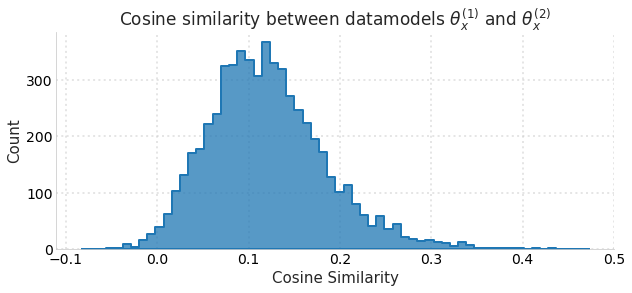

In [19]:
keys = list(itertools.combinations(dm_paths.keys(), 2))
cs_map = {} 

for k1, k2 in keys:
    if k1==k2: continue
    dm1 = torch.load(dm_paths[k1])['weight'].T.numpy()
    dm2 = torch.load(dm_paths[k2])['weight'].T.numpy()
    cs_map[(k1,k2)] = dm_utils.get_cosine_similarity(dm1, dm2)
    
fig, ax = plt.subplots(1,1,figsize=(10,4))
for idx, ((k1,k2), cs) in enumerate(cs_map.items()): 
    mean_cs = np.mean(cs)
    ax = sns.histplot(cs, color=cmap(idx), ax=ax, **hist_kws)
    
common_utils.update_ax(ax, 
                       r'Cosine similarity between datamodels $\theta^{(1)}_x$ and $\theta^{(2)}_x$', 
                       'Cosine Similarity', 'Count', legend_loc=False, **font_kws)

## Top-most datamodel influencers
Find top-most training examples that have the largest magnitude datmaodel weight in $\theta^{(1)}_x$ and $\theta^{(2)}_x$ for randomly sampled CIFAR-10 test image $x$.

In [20]:
class_names = {
    0: 'L on L', # landbirds on land
    1: 'W on L',
    2: 'L on W',
    3: 'W on W'
}

labels = torch.load('metadata/waterbirds_labels.pkl')
labels = {k: [[x] for x in v['group']] for k, v in labels.items()}

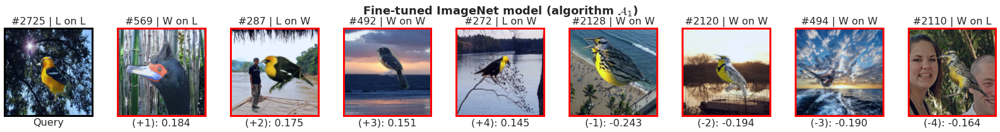

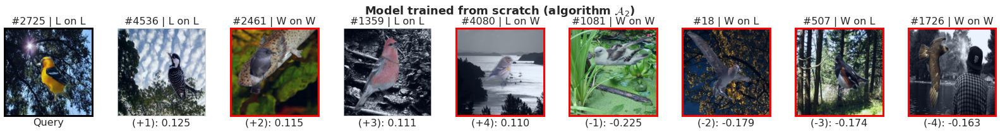

In [21]:
# visualize images with large magnitude datamodel weights  
inf_map = {}

for k, dm_path in dm_paths.items():
    dm = torch.load(dm_path)['weight'] 
    inf_map[k] = dm_utils.InfluenceVisualizer(dm, 'test', dsets, 
                                              label_indices=[0], 
                                              label_tuples=labels)
    
random_indices = np.random.randint(0, high=len(dsets['test']), size=1)
for k, inf in inf_map.items():
    fig, ax_grid = inf.plot_influencers(random_indices, 8, mode='both', 
                                        class_names=class_names)
    fig.suptitle(dm_names[k], y=1.1, fontsize=18, fontweight='bold')

## PCA on residual datamodels $\{\theta^{(1\setminus 2)}_x\}$

### Run PCA
Visualize PC components of residual datamodel matrix $\theta^{(1\setminus 2)}_x$. These PC components correspond to training directions that are more "important" for  models pre-trained on ImageNet (algorithm $\mathcal{A}_1$) but not models trained from scratch (algorithm $\mathcal{A}_2$).

Text(0.5, 0.95, 'Principal components of residual datamodel $\\theta^{(1-2)}$')

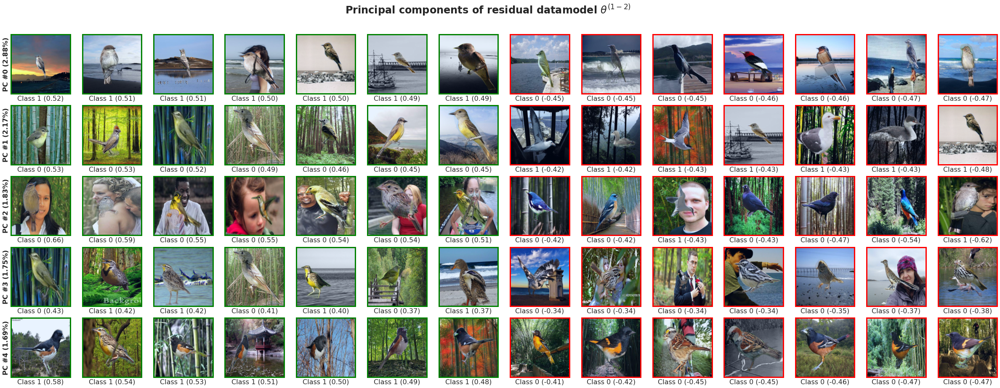

In [23]:
# compute + visualize PCA directions of residual datamodel (with-augmentation minus without-augmentation)
num_pcs = 50
pca = dm_utils.ModelDiff(dm_paths['ImageNet'], dm_paths['From scratch'], num_pcs, dsets)
fig, ax_grid = pca.plot_principal_component_images(range(5), 7, class_names=class_names)
fig.suptitle(r'Principal components of residual datamodel $\theta^{(1-2)}$', fontsize=24, fontweight='bold', y=0.95)

### Explained variance of residual PC directions
PC components of residual datamodel matrix $\theta^{(1\setminus 2)}_x$ have high explained variance with respect to datamodel matrix $\theta^{(1)}$ (with pre-training) and low explained variance with respect to datamodel matrix $\theta^{(2)}$ (without pre-training).

<AxesSubplot:title={'center':'Comparison of explained variance fraction'}, xlabel='Explained variance under Algorithm $\\mathcal{A}_1$ (with pre-training)', ylabel='Explained variance under Algorithm $\\mathcal{A}_2$ (without pre-training)'>

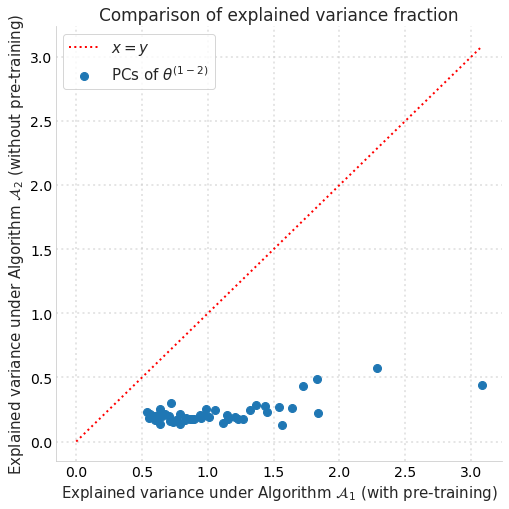

In [24]:
# visualize explained variance 
device = torch.device('cpu')
comps = torch.FloatTensor(pca.pca_components)
dm_map = {k: torch.FloatTensor(dm_utils.load_datamodel(v)) for k, v in dm_paths.items()}
ev_map = {k: dm_utils.get_explained_variance(dm, comps, device, batch_size=100)*100 for k, dm in dm_map.items()}

fig, ax = plt.subplots(1,1,figsize=(8,8))
xy = np.linspace(0, max(max(ev_map['ImageNet']), max(ev_map['From scratch'])))
ax.plot(xy, xy, color='red', ls=':', lw=2, label=r'$x=y$')
ax.scatter(ev_map['ImageNet'], ev_map['From scratch'], marker='o', s=64, label=r'PCs of $\theta^{(1-2)}$')
common_utils.update_ax(ax, 'Comparison of explained variance fraction', 
                       r'Explained variance under Algorithm $\mathcal{A}_1$ (with pre-training)',
                       r'Explained variance under Algorithm $\mathcal{A}_2$ (without pre-training)',
                       **font_kws)

### Subpopulations surfaced by PC directions #2
Visualize subpopulations of test examples surfaced by PC directions #2---a direction that we analyze in the paper. These test examples correspond to examples whose residual datamodel vectors $\theta^{(1-2)}_x$ are most (positively) aligned with the PC directions.

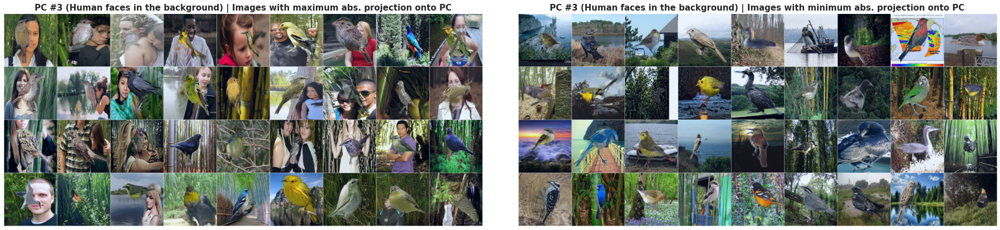

In [25]:
# visualize pca subpopulations of PC #2 (spider web) and PC#5 (polka dots)
comp_indices=[2]
num_comps = len(comp_indices)
num_imgs = 36
per_row = 9
title_fs = 15

fig, axs = plt.subplots(num_comps, 2, figsize=(25, 5.67*num_comps))
if num_comps==1: axs = [axs]
feat_names = ['Human faces in the background']

for idx, ax_pair in enumerate(axs):
    direction = dm_utils.Direction(pca.pca_components[comp_indices[idx]], pca.X, pca.datasets_map['test'], use_abs=True)
    titles = ['PC #{} ({}) | Images with maximum abs. projection onto PC'.format(comp_indices[idx]+1, feat_names[idx]), 
              'PC #{} ({}) | Images with minimum abs. projection onto PC'.format(comp_indices[idx]+1, feat_names[idx])]
    direction.visualize_grid(num_imgs, per_row, titles=titles, axs=ax_pair, padding=1)

    for ax, title in zip(ax_pair, titles):
        ax.set_title(title, fontsize=title_fs, fontweight='bold')

fig.tight_layout()
fig.subplots_adjust(wspace=0.075)
None

## PCA on residual datamodels $\{\theta^{(2 \setminus 1)}_x\}$

### Run PCA
Visualize PC components of residual datamodel matrix $\theta^{(2\setminus 1)}_x$. These PC components correspond to training directions that are more "important" for  models pre-trained on models trained from scratch (algorithm $\mathcal{A}_2$) but not models pre-trained on ImageNet (algorithm $\mathcal{A}_1$).

Text(0.5, 0.95, 'Principal components of residual datamodel $\\theta^{(2-1)}$')

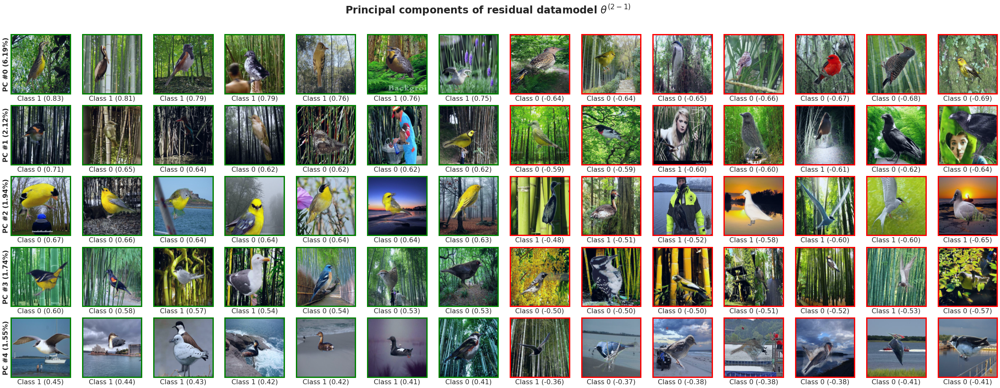

In [26]:
# compute + visualize PCA directions of residual datamodel (with-augmentation minus without-augmentation)
num_pcs = 50
pca = dm_utils.ModelDiff(dm_paths['From scratch'], dm_paths['ImageNet'], num_pcs, dsets)
fig, ax_grid = pca.plot_principal_component_images(range(5), 7, class_names=class_names)
fig.suptitle(r'Principal components of residual datamodel $\theta^{(2-1)}$', fontsize=24, fontweight='bold', y=0.95)

### Explained variance of residual PC directions
PC components of residual datamodel matrix $\theta^{(2\setminus 1)}_x$ have high explained variance with respect to datamodel matrix $\theta^{(2)}$ and low explained variance with respect to datamodel matrix $\theta^{(1)}$.

<AxesSubplot:title={'center':'Comparison of explained variance fraction'}, xlabel='Explained variance under Algorithm $\\mathcal{A}_1$ (with pre-training)', ylabel='Explained variance under Algorithm $\\mathcal{A}_2$ (without pre-training)'>

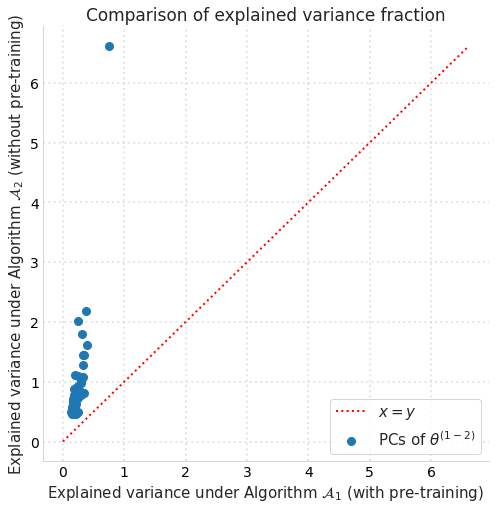

In [27]:
# visualize explained variance 
device = torch.device('cpu')
comps = torch.FloatTensor(pca.pca_components)
dm_map = {k: torch.FloatTensor(dm_utils.load_datamodel(v)) for k, v in dm_paths.items()}
ev_map = {k: dm_utils.get_explained_variance(dm, comps, device, batch_size=100)*100 for k, dm in dm_map.items()}

fig, ax = plt.subplots(1,1,figsize=(8,8))
xy = np.linspace(0, max(max(ev_map['ImageNet']), max(ev_map['From scratch'])))
ax.plot(xy, xy, color='red', ls=':', lw=2, label=r'$x=y$')
ax.scatter(ev_map['ImageNet'], ev_map['From scratch'], marker='o', s=64, label=r'PCs of $\theta^{(1-2)}$')
common_utils.update_ax(ax, 'Comparison of explained variance fraction', 
                       r'Explained variance under Algorithm $\mathcal{A}_1$ (with pre-training)',
                       r'Explained variance under Algorithm $\mathcal{A}_2$ (without pre-training)',
                       **font_kws)

### Subpopulations surfaced by PC directions #2
Visualize subpopulations of test examples surfaced by PC directions #2---a direction that we analyze in the paper. These test examples correspond to examples whose residual datamodel vectors $\theta^{(1-2)}_x$ are most (positively) aligned with the PC directions.

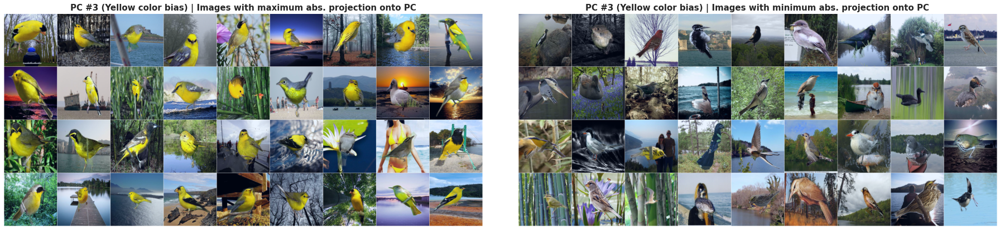

In [28]:
# visualize pca subpopulations of PC #2 (spider web) and PC#5 (polka dots)
comp_indices=[2]
num_comps = len(comp_indices)
num_imgs = 36
per_row = 9
title_fs = 15

fig, axs = plt.subplots(num_comps, 2, figsize=(25, 5.67*num_comps))
if num_comps==1: axs = [axs]
feat_names = ['Yellow color bias']

for idx, ax_pair in enumerate(axs):
    direction = dm_utils.Direction(pca.pca_components[comp_indices[idx]], pca.X, pca.datasets_map['test'], use_abs=True)
    titles = ['PC #{} ({}) | Images with maximum abs. projection onto PC'.format(comp_indices[idx]+1, feat_names[idx]), 
              'PC #{} ({}) | Images with minimum abs. projection onto PC'.format(comp_indices[idx]+1, feat_names[idx])]
    direction.visualize_grid(num_imgs, per_row, titles=titles, axs=ax_pair, padding=1)

    for ax, title in zip(ax_pair, titles):
        ax.set_title(title, fontsize=title_fs, fontweight='bold')

fig.tight_layout()
fig.subplots_adjust(wspace=0.075)
None

## Effect of distinguishing feature transformations
Plot treatment effect of distinguishing feature transformations corresponding to "human face" and "yellow color". See scripts in `counterfactuals/` for code. 

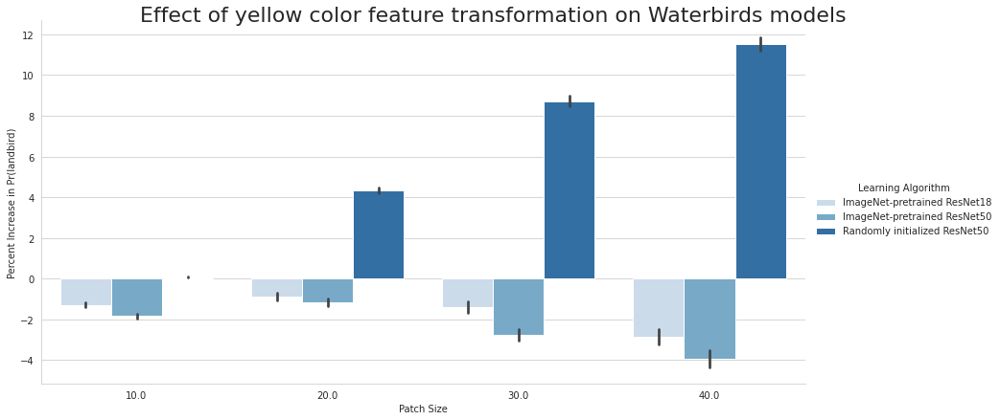

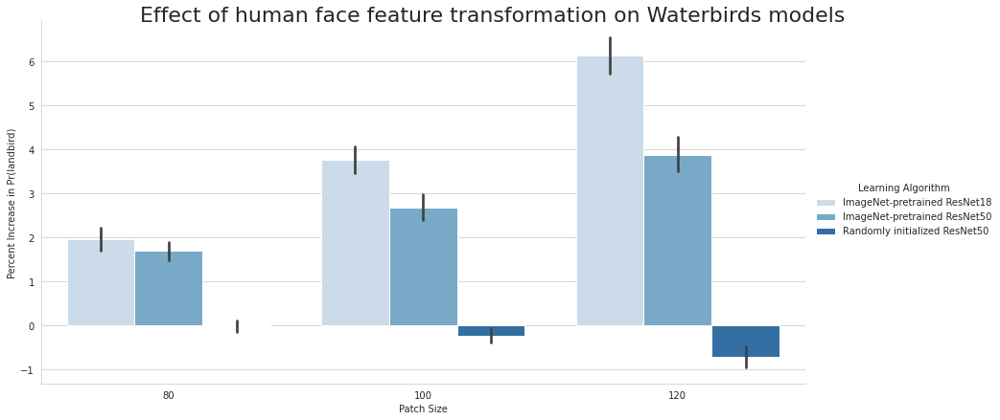

In [29]:
def plot_yellow_patch():
    df = pd.read_pickle('metadata/waterbirds_yellow_dataframe.pkl')
    effect_col = '$\Pr(Y=1|yellow)-\Pr(Y=1|control)$'
    new_effect_col = 'Percent Increase in Pr(landbird)'

    df['datamodel'] = df['datamodel'].apply(lambda d: {
        'imagenet-pretrained res18': 'ImageNet-pretrained ResNet18',
        'imagenet-pretrained res50': 'ImageNet-pretrained ResNet50',
        'random-init res50': 'Randomly initialized ResNet50'
    }[d])

    df = df.sort_values('datamodel')

    df = df.rename(columns={'patch size': 'Patch Size', 
                            effect_col: new_effect_col,
                            'datamodel': 'Learning Algorithm'})
    df[new_effect_col] *= 100
    
    plot_df = df[df['Patch Size'].apply(lambda p: p not in {0})]
    
    fg = sns.catplot(x='Patch Size', y=new_effect_col, 
                     kind='bar', hue='Learning Algorithm', 
                     data=plot_df, aspect=2, palette='Blues', height=6)

    fg.fig.suptitle(f'Effect of yellow color feature transformation on Waterbirds models', fontsize=22, y=1.01)
    return fg.fig

def plot_face_patch():
    df = pd.read_pickle('metadata/waterbirds_face_dataframe.pkl')
    effect_col = '$\Pr(Y=1|face)-\Pr(Y=1|control)$'
    new_effect_col = 'Percent Increase in Pr(landbird)'

    df['datamodel'] = df['datamodel'].apply(lambda d: {
        'imagenet-pretrained res18': 'ImageNet-pretrained ResNet18',
        'imagenet-pretrained res50': 'ImageNet-pretrained ResNet50',
        'random-init res50': 'Randomly initialized ResNet50'
    }[d])

    df = df.sort_values('datamodel')
    df = df.rename(columns={'face patch size': 'Patch Size', 
                            effect_col: new_effect_col,
                            'datamodel': 'Learning Algorithm'})
    df[new_effect_col] *= 100
    
    plot_df = df[df['Patch Size'].apply(lambda p: p in {80,100,120})]
    
    fg = sns.catplot(x='Patch Size', y=new_effect_col, 
                     kind='bar', hue='Learning Algorithm', 
                     data=plot_df, aspect=2, palette='Blues', height=6)

    fg.fig.suptitle(f'Effect of human face feature transformation on Waterbirds models', fontsize=22, y=1.01)
    return fg.fig

fig = plot_yellow_patch()
fig = plot_face_patch()
None